In this script I explored the Google Satellite Embedding database. My motivation was to see how patterns of similarity in the embedding space relate to the physical topography of San Francisco and the broader Bay Area.

To start, I defined polygons for San Francisco and the Bay Area and filtered the embedding image collections to these regions and the target year (2024). I compared two sampling methods: Google Earth Engine’s random sampling and a custom function to generate a regular grid of points. For each sampled location, I extracted the 64-dimensional embedding vector and the latitude and longitude into dataframes.

To analyze spatial relationships, I constructed k-nearest neighbor (kNN) networks in the embedding space using cosine similarity. For each sampled point, I identified its 5 nearest neighbors and computed both embedding-space distances and physical distances to its neighbors. I visualized the resulting networks on Folium maps, coloring edges by either embedding similarity or geographic distance.

After mapping the similarity network across the Bay Area, I noticed that many edges appear to follow the Pacific coast line, suggesting that similar environmental conditions occur along trajectories parallel to the coast. To quantify this observation, I computed the angles of each edge in the network, treating them as undirected (0,180). I then visualized the distribution of angles in a histogram, using the random sampling dataframes to minimize the 0 and 90 degree edges that were common in the regular grid sampled networks. This confirmed that there is a spike of 125 degree edges in the Bay Area, suggesting that similar surface conditions tend to be equidistant from the coast.


In [1]:
import ee
import geemap
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt


ee.Authenticate()
ee.Initialize(project="gsapp-map")

In [2]:
# Access the Satellite Embedding Dataset
embeddings = ee.ImageCollection("GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL")

year = 2024
start_date = ee.Date.fromYMD(year, 1, 1)
end_date = start_date.advance(1, "year")

geometry_sf = ee.Geometry.Polygon(
    [
        [
            [-122.52, 37.70],
            [-122.52, 37.82],
            [-122.35, 37.82],
            [-122.35, 37.70],
            [-122.52, 37.70],
        ]
    ]
)

geometry_bay = ee.Geometry.Polygon(
    [
        [
            [-123.0, 37.0],
            [-123.0, 38.5],
            [-121.5, 38.5],
            [-121.5, 37.0],
            [-123.0, 37.0],
        ]
    ]
)

filtered_embeddings_sf = embeddings.filter(ee.Filter.date(start_date, end_date)).filter(
    ee.Filter.bounds(geometry_sf)
)
embeddings_image_sf = filtered_embeddings_sf.mosaic()


filtered_embeddings_bay = embeddings.filter(
    ee.Filter.date(start_date, end_date)
).filter(ee.Filter.bounds(geometry_bay))
embeddings_image_bay = filtered_embeddings_bay.mosaic()

In [3]:
# This section is unrelated to the rest of the notebook
# Visualize three axes of the embedding space as an RGB (for export or display in Colab)
vis_params = {"min": -0.3, "max": 0.3, "bands": ["A01", "A16", "A09"]}

# Sample points for training
n_samples = 1000
training = embeddings_image_sf.sample(
    region=geometry_sf, scale=10, numPixels=n_samples, seed=100, geometries=True
)
print(training.first().getInfo())


# Function to train a model for desired number of clusters
def get_clusters(n_clusters):
    clusterer = ee.Clusterer.wekaKMeans(n_clusters).train(training)
    clustered = embeddings_image_sf.cluster(clusterer)
    return clustered


cluster3 = get_clusters(3)
cluster5 = get_clusters(5)
cluster10 = get_clusters(10)

Map = geemap.Map(center=[37.76, -122.43], zoom=12)
Map.add_basemap("TopPlusOpen.Grey")

# Add the RGB embedding image
Map.addLayer(embeddings_image_sf.clip(geometry_sf), vis_params, "Embeddings Image")

# Add clusters (choose one, e.g., cluster3)
Map.addLayer(cluster3.clip(geometry_sf).randomVisualizer(), {}, "3 Clusters")
Map.addLayer(cluster5.clip(geometry_sf).randomVisualizer(), {}, "5 Clusters")
Map.addLayer(cluster10.clip(geometry_sf).randomVisualizer(), {}, "10 Clusters")

Map.addLayer(geometry_sf, {}, "Region")
Map

{'type': 'Feature', 'geometry': {'type': 'Point', 'coordinates': [-122.43624218795829, 37.7564904697259]}, 'id': '0', 'properties': {'A00': 0.12456747404844293, 'A01': -0.2519646289888504, 'A02': 0.11374086889657825, 'A03': 0.044844290657439445, 'A04': 0.04822760476739715, 'A05': -0.14173010380622836, 'A06': -0.09842368319876971, 'A07': -0.041584006151480196, 'A08': 0.13016532103037293, 'A09': -0.17279507881584008, 'A10': 0.07111111111111111, 'A11': 0.12456747404844293, 'A12': -0.19986159169550174, 'A13': -0.24415224913494812, 'A14': 0.03543252595155709, 'A15': -0.003936947327950788, 'A16': 0.14173010380622836, 'A17': 0.16000000000000003, 'A18': -0.05173394848135333, 'A19': -0.007443291041906958, 'A20': 0.13588619761630144, 'A21': 0.05173394848135333, 'A22': -0.08421376393694734, 'A23': 0.0629911572472126, 'A24': -0.010396001537870049, 'A25': 0.34602076124567477, 'A26': -0.03844675124951941, 'A27': 0.019930795847750864, 'A28': 0.19986159169550174, 'A29': 0.07535563244905807, 'A30': -0.

Map(center=[37.76, -122.43], controls=(WidgetControl(options=['position', 'transparent_bg'], position='toprigh…

In [4]:
import folium
import matplotlib


# Normalize a numpy array to [0, 1] for colormap mapping.
def normalize_values(values):
    min_val = np.nanmin(values)
    max_val = np.nanmax(values)
    if max_val == min_val:
        return np.zeros_like(values)
    return (values - min_val) / (max_val - min_val)


# Add network edges to a folium map.
# Color by distance (yellow=more similar, blue=less similar).
def add_network_edges(m, df, indices, distances):
    distances_norm = normalize_values(distances)
    for i, row in df.iterrows():
        for idx, j in enumerate(indices[i][1:]):  # skip self
            sim = 1 - distances_norm[i][idx + 1]
            color = matplotlib.colors.to_hex(plt.cm.viridis(sim))
            latlngs = [
                [row["lat"], row["lon"]],
                [df.iloc[j]["lat"], df.iloc[j]["lon"]],
            ]
            folium.PolyLine(latlngs, color=color, weight=1, opacity=0.3).add_to(m)


# Add nodes as points to a folium map.
def add_network_nodes(m, df):
    for _, row in df.iterrows():
        folium.CircleMarker(
            location=[row["lat"], row["lon"]],
            radius=1,
            color="gray",
            fill=True,
            fill_opacity=0.7,
            weight=0,
        ).add_to(m)


def haversine(lat1, lon1, lat2, lon2):
    """
    Calculate the great-circle distance between two points on the Earth (in km).
    """
    R = 6371  # Earth radius in kilometers
    phi1, phi2 = np.radians(lat1), np.radians(lat2)
    dphi = np.radians(lat2 - lat1)
    dlambda = np.radians(lon2 - lon1)
    a = np.sin(dphi / 2) ** 2 + np.cos(phi1) * np.cos(phi2) * np.sin(dlambda / 2) ** 2
    return 2 * R * np.arcsin(np.sqrt(a))


#  Add network edges to a folium map, colored by geographic (physical) distance.
def add_network_edges_geodist(m, df, indices):
    # Compute all edge distances
    edge_distances = []
    edge_pairs = []
    for i, row in df.iterrows():
        for idx, j in enumerate(indices[i][1:]):  # skip self
            lat1, lon1 = row["lat"], row["lon"]
            lat2, lon2 = df.iloc[j]["lat"], df.iloc[j]["lon"]
            dist = haversine(lat1, lon1, lat2, lon2)
            edge_distances.append(dist)
            edge_pairs.append((i, j))
    # Normalize distances for colormap
    edge_distances = np.array(edge_distances)
    normed = (edge_distances - edge_distances.min()) / (
        edge_distances.max() - edge_distances.min() + 1e-12
    )
    # Draw edges
    for (i, j), norm_val in zip(edge_pairs, normed):
        color = matplotlib.colors.to_hex(plt.cm.viridis(1 - norm_val))
        latlngs = [
            [df.iloc[i]["lat"], df.iloc[i]["lon"]],
            [df.iloc[j]["lat"], df.iloc[j]["lon"]],
        ]
        folium.PolyLine(latlngs, color=color, weight=1, opacity=0.3).add_to(m)

In [5]:
# Network of embedding similarity: SF, random sample, colored by embedding dist

n_samples = 1000
training_sf_rand = embeddings_image_sf.sample(
    region=geometry_sf, scale=10, numPixels=n_samples, seed=100, geometries=True
)
sample_fc_sf_rand = training_sf_rand.getInfo()

# convert to df
records = []
for f in sample_fc_sf_rand["features"]:
    coords = f["geometry"]["coordinates"]
    props = f["properties"]
    embedding = [props.get(f"A{str(i).zfill(2)}") for i in range(1, 64)]
    records.append({"lon": coords[0], "lat": coords[1], "embedding": embedding})

df_sf_rand = pd.DataFrame(records)

# build the embedding similarity network
embeddings_sf_rand = np.vstack(df_sf_rand["embedding"].values)
knn = 5

# Use NearestNeighbors in embedding space (cosine similarity)
nbrs_sf_rand = NearestNeighbors(n_neighbors=knn + 1, metric="cosine").fit(
    embeddings_sf_rand
)
distances_sf_rand, indices_sf_rand = nbrs_sf_rand.kneighbors(embeddings_sf_rand)

m_sf_rand = folium.Map(
    location=[df_sf_rand["lat"].mean(), df_sf_rand["lon"].mean()],
    zoom_start=12,
    tiles="cartodbpositron",
)
add_network_edges(m_sf_rand, df_sf_rand, indices_sf_rand, distances_sf_rand)
add_network_nodes(m_sf_rand, df_sf_rand)
m_sf_rand

In [6]:
# google earth's provided sample only supports random; add a grid sample function
def get_regular_sample(embeddings_image, geometry, step):
    coords = np.array(geometry.bounds().getInfo()["coordinates"][0])
    lons = coords[:, 0]
    lats = coords[:, 1]
    lon_min, lon_max = lons.min(), lons.max()
    lat_min, lat_max = lats.min(), lats.max()

    lons = np.arange(lon_min, lon_max, step)
    lats = np.arange(lat_min, lat_max, step)

    points = []
    for lon in lons:
        for lat in lats:
            points.append(ee.Feature(ee.Geometry.Point([lon, lat])))

    grid_fc = ee.FeatureCollection(points)

    # Sample the image at these points
    return embeddings_image.sampleRegions(collection=grid_fc, scale=10, geometries=True)

In [7]:
# Network of embedding similarity: SF, regular sample, colored by embedding dist

_500m = 0.005  # ~500m
training_sf_reg = get_regular_sample(embeddings_image_sf, geometry_sf, _500m)
sample_fc_sf_reg = training_sf_reg.getInfo()

# convert to DataFrame
records = []
for f in sample_fc_sf_reg["features"]:
    coords = f["geometry"]["coordinates"]
    props = f["properties"]
    embedding = [props.get(f"A{str(i).zfill(2)}") for i in range(1, 64)]
    records.append({"lon": coords[0], "lat": coords[1], "embedding": embedding})

df_sf_reg = pd.DataFrame(records)

# build the embedding similarity network
embeddings_sf_reg = np.vstack(df_sf_reg["embedding"].values)
knn = 5

# Use NearestNeighbors in embedding space (cosine similarity)
nbrs_sf_reg = NearestNeighbors(n_neighbors=knn + 1, metric="cosine").fit(
    embeddings_sf_reg
)
distances_sf_reg, indices_sf_reg = nbrs_sf_reg.kneighbors(embeddings_sf_reg)

m_sf_reg_emb_dist = folium.Map(
    location=[df_sf_reg["lat"].mean(), df_sf_reg["lon"].mean()],
    zoom_start=12,
    tiles="cartodbpositron",
)
add_network_edges(m_sf_reg_emb_dist, df_sf_reg, indices_sf_reg, distances_sf_reg)
add_network_nodes(m_sf_reg_emb_dist, df_sf_reg)
m_sf_reg_emb_dist

In [8]:
# Network of embedding similarity: SF, regular sample, colored by geographical dist

m_sf_reg_geo_dist = folium.Map(
    location=[df_sf_reg["lat"].mean(), df_sf_reg["lon"].mean()],
    zoom_start=12,
    tiles="cartodbpositron",
)
add_network_edges_geodist(m_sf_reg_geo_dist, df_sf_reg, indices_sf_reg)
add_network_nodes(m_sf_reg_geo_dist, df_sf_reg)
m_sf_reg_geo_dist

In [9]:
# Network of embedding similarity: bay area, random sample, colored by embedding dist

n_samples = 1000
training_bay_rand = embeddings_image_bay.sample(
    region=geometry_bay, scale=10, numPixels=n_samples, seed=100, geometries=True
)
sample_fc_bay_rand = training_bay_rand.getInfo()

# convert to DataFrame
records = []
for f in sample_fc_bay_rand["features"]:
    coords = f["geometry"]["coordinates"]
    props = f["properties"]
    embedding = [props.get(f"A{str(i).zfill(2)}") for i in range(1, 64)]
    records.append({"lon": coords[0], "lat": coords[1], "embedding": embedding})

df_bay_rand = pd.DataFrame(records)

# build the embedding similarity network
embeddings_bay_rand = np.vstack(df_bay_rand["embedding"].values)
knn = 5

# Use NearestNeighbors in embedding space (cosine similarity)
nbrs_bay_rand = NearestNeighbors(n_neighbors=knn + 1, metric="cosine").fit(
    embeddings_bay_rand
)
distances_bay_rand, indices_bay_rand = nbrs_bay_rand.kneighbors(embeddings_bay_rand)

m_bay_rand_emb_dist = folium.Map(
    location=[df_bay_rand["lat"].mean(), df_bay_rand["lon"].mean()],
    zoom_start=8,
    tiles="cartodbpositron",
)
add_network_edges(
    m_bay_rand_emb_dist, df_bay_rand, indices_bay_rand, distances_bay_rand
)
add_network_nodes(m_bay_rand_emb_dist, df_bay_rand)
m_bay_rand_emb_dist

In [10]:
# Network of embedding similarity: bay area, regular sample, colored by embedding dist

_8km = 0.08
training_bay_reg = get_regular_sample(embeddings_image_bay, geometry_bay, _8km)
sample_fc_bay_reg = training_bay_reg.getInfo()

# convert to df
records = []
for f in sample_fc_bay_reg["features"]:
    coords = f["geometry"]["coordinates"]
    props = f["properties"]
    embedding = [props.get(f"A{str(i).zfill(2)}") for i in range(1, 64)]
    records.append({"lon": coords[0], "lat": coords[1], "embedding": embedding})

df_bay_reg = pd.DataFrame(records)

# build the embedding similarity network
embeddings_bay_reg = np.vstack(df_bay_reg["embedding"].values)
knn = 5

# Use NearestNeighbors in embedding space (cosine similarity)
nbrs_bay_reg = NearestNeighbors(n_neighbors=knn + 1, metric="cosine").fit(
    embeddings_bay_reg
)
distances_bay_reg, indices_bay_reg = nbrs_bay_reg.kneighbors(embeddings_bay_reg)

m_bay_reg_emb_dist = folium.Map(
    location=[df_bay_reg["lat"].mean(), df_bay_reg["lon"].mean()],
    zoom_start=8,
    tiles="cartodbpositron",
)
add_network_edges(m_bay_reg_emb_dist, df_bay_reg, indices_bay_reg, distances_bay_reg)
add_network_nodes(m_bay_reg_emb_dist, df_bay_reg)
m_bay_reg_emb_dist

In [11]:
# Network of embedding similarity: bay area, regular sample, colored by geographical dist

m_bay_reg_geo_dist = folium.Map(
    location=[df_bay_reg["lat"].mean(), df_bay_reg["lon"].mean()],
    zoom_start=8,
    tiles="cartodbpositron",
)
add_network_edges_geodist(m_bay_reg_geo_dist, df_bay_reg, indices_bay_reg)
add_network_nodes(m_bay_reg_geo_dist, df_bay_reg)
m_bay_reg_geo_dist

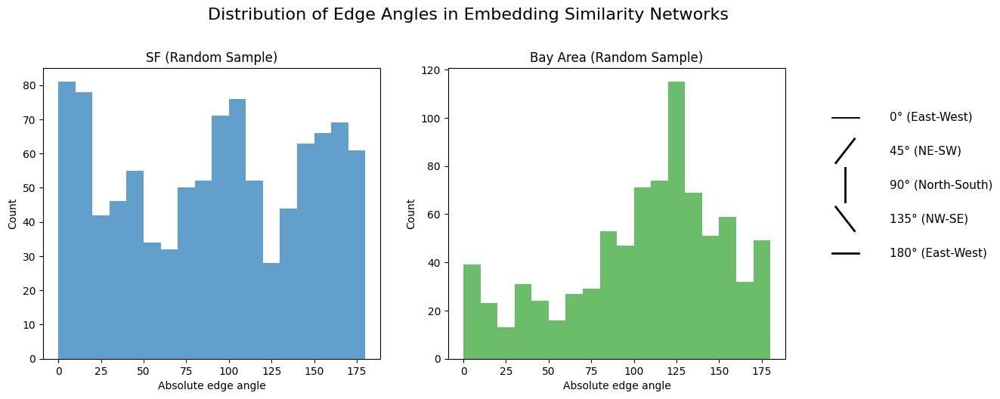

In [12]:
# Histogram distribution of edge angles

import matplotlib.lines as mlines


def compute_edge_angles(df, indices):
    """
    Compute edge angles in [0, 180] degrees (0=east, 90=north, 180=west).
    NE and SW are the same, NW and SE are the same, because the edges are undirected.
    """
    angles = []
    for i, row in df.iterrows():
        j = indices[i][1]
        lat1, lon1 = row["lat"], row["lon"]
        lat2, lon2 = df.iloc[j]["lat"], df.iloc[j]["lon"]
        dx = lon2 - lon1
        dy = lat2 - lat1
        angle = np.degrees(np.arctan2(dy, dx)) % 180  # 0 to 180
        angles.append(angle)
    return np.array(angles)


# Compute angles for both regular and bay area samples
angles_sf_reg = compute_edge_angles(df_sf_reg, indices_sf_reg)
angles_sf_rand = compute_edge_angles(df_sf_rand, indices_sf_rand)
angles_bay_reg = compute_edge_angles(df_bay_reg, indices_bay_reg)
angles_bay_rand = compute_edge_angles(df_bay_rand, indices_bay_rand)

# Side-by-side histogram
plt.figure(figsize=(15, 5))
plt.suptitle(
    "Distribution of Edge Angles in Embedding Similarity Networks", fontsize=16, y=1.04
)
bins = np.linspace(0, 180, 19)

# Draw histograms
ax1 = plt.subplot(1, 2, 1)
plt.hist(angles_sf_rand, bins=bins, color="tab:blue", alpha=0.7)
plt.title("SF (Random Sample)")
plt.xlabel("Absolute edge angle")
plt.ylabel("Count")

ax2 = plt.subplot(1, 2, 2)
plt.hist(angles_bay_rand, bins=bins, color="tab:green", alpha=0.7)
plt.title("Bay Area (Random Sample)")
plt.xlabel("Absolute edge angle")
plt.ylabel("Count")

# Add a legend with lines for key angles
legend_angles = [0, 45, 90, 135, 180]
legend_labels = [
    "0° (East-West)",
    "45° (NE-SW)",
    "90° (North-South)",
    "135° (NW-SE)",
    "180° (East-West)",
]
legend_lines = []
for angle in legend_angles:
    theta = np.radians(angle)
    # Create a short line segment for the legend
    x0, y0 = 0, 0
    x1 = 0.8 * np.cos(theta)
    y1 = 0.8 * np.sin(theta)
    line = mlines.Line2D([x0 - x1, x0 + x1], [y0 - y1, y0 + y1], color="k", lw=2)
    legend_lines.append(line)

# Place legend to the right of the plots
plt.gcf().subplots_adjust(right=0.78)  # Leave space for legend
legend_ax = plt.gcf().add_axes([0.80, 0.25, 0.13, 0.5])  # Place legend in the new space
legend_ax.axis("off")
for i, (angle, label) in enumerate(zip(legend_angles, legend_labels)):
    theta = np.radians(angle)
    y = 1 - i * 0.18
    x_center, y_center = 0.25, y
    length = 0.18
    dx = (length / 2) * np.cos(theta)
    dy = (length / 2) * np.sin(theta)
    x0, x1 = x_center - dx, x_center + dx
    y0, y1 = y_center - dy, y_center + dy
    line = mlines.Line2D(
        [x0, x1], [y0, y1], color="k", lw=2, transform=legend_ax.transAxes
    )
    legend_ax.add_line(line)
    legend_ax.text(
        0.55, y, label, va="center", fontsize=11, transform=legend_ax.transAxes
    )

plt.show()

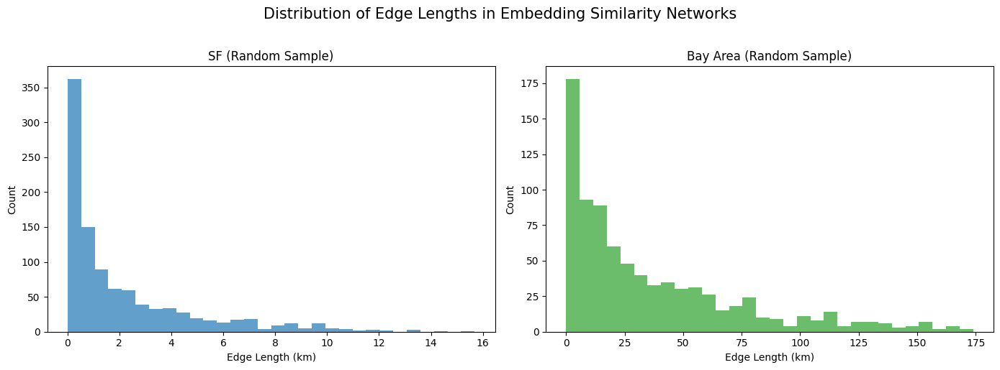

In [13]:
# Histogram distribution of edge lengths


def compute_edge_lengths(df, indices):
    lengths = []
    for i, row in df.iterrows():
        j = indices[i][1]
        lat1, lon1 = row["lat"], row["lon"]
        lat2, lon2 = df.iloc[j]["lat"], df.iloc[j]["lon"]
        # Use your haversine function
        length = haversine(lat1, lon1, lat2, lon2)
        lengths.append(length)
    return np.array(lengths)


lengths_sf_rand = compute_edge_lengths(df_sf_rand, indices_sf_rand)
lengths_bay_rand = compute_edge_lengths(df_bay_rand, indices_bay_rand)

plt.figure(figsize=(14, 5))

# SF
ax1 = plt.subplot(1, 2, 1)
ax1.hist(lengths_sf_rand, bins=30, color="tab:blue", alpha=0.7)
ax1.set_xlabel("Edge Length (km)")
ax1.set_ylabel("Count")
ax1.set_title("SF (Random Sample)")

# Bay Area
ax2 = plt.subplot(1, 2, 2)
ax2.hist(lengths_bay_rand, bins=30, color="tab:green", alpha=0.7)
ax2.set_xlabel("Edge Length (km)")
ax2.set_ylabel("Count")
ax2.set_title("Bay Area (Random Sample)")

plt.suptitle(
    "Distribution of Edge Lengths in Embedding Similarity Networks", fontsize=15, y=1.02
)
plt.tight_layout()
plt.show()